### Importing the libraries

In [96]:
import pandas as pd
import numpy as np
import concurrent.futures
import torch
import cv2
import random
import ast
import requests
import matplotlib.pyplot as plt
from PIL import ImageFile, Image
from io import BytesIO
from sklearn.cluster import KMeans
ImageFile.LOAD_TRUNCATED_IMAGES = True

### Creating the dataframe

In [97]:
data1 = pd.read_csv(
    '/media/hdd2/navaneeth/Deep-Learning-Projects/pytorch/color/color_bags.csv')
data2 = pd.read_csv(
    '/media/hdd2/navaneeth/Deep-Learning-Projects/pytorch/color/color_tops.csv')
data3 = pd.read_csv(
    '/media/hdd2/navaneeth/Deep-Learning-Projects/pytorch/color/color_pants.csv')

In [98]:
data = pd.concat([data1, data2, data3], ignore_index=True)
data = data[data['Category'].isin(['Bags', 'Pants', 'Tops'])]
data['Category_bbox'] = data['Category_bbox'].apply(
    lambda x: ast.literal_eval(x))

### Downloading the images from URL and saving

In [99]:
""" def download_image(url, file_name):
    r = requests.get(url, stream=True)
    if r.status_code == 200:
        print('Downloading ' + file_name)
        r.raw.decode_content = True
        with open(file_name, 'wb') as f:
            f.write(r.content)
        return file_name
    else:
        return None

with concurrent.futures.ThreadPoolExecutor() as executor:
    for i, row in data.iterrows():
        file_name = 'images/' + str(i) + '.jpg'
        url = row['image_url']
        executor.submit(download_image, url, file_name) """

" def download_image(url, file_name):\n    r = requests.get(url, stream=True)\n    if r.status_code == 200:\n        print('Downloading ' + file_name)\n        r.raw.decode_content = True\n        with open(file_name, 'wb') as f:\n            f.write(r.content)\n        return file_name\n    else:\n        return None\n\nwith concurrent.futures.ThreadPoolExecutor() as executor:\n    for i, row in data.iterrows():\n        file_name = 'images/' + str(i) + '.jpg'\n        url = row['image_url']\n        executor.submit(download_image, url, file_name) "

### Removing Unnecessary data from each dataset

In [100]:
""" data.drop(['image_url'], axis=1, inplace=True)
data.drop(['Category'], axis=1, inplace=True) """

" data.drop(['image_url'], axis=1, inplace=True)\ndata.drop(['Category'], axis=1, inplace=True) "

### Adding image data to the dataframes

In [101]:
def preprocess_image(file):
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


def preprocess_image_crop(file, labels_crops):
    img = cv2.imread(file)
    x1, y1, x2, y2 = int(labels_crops[0]), int(
        labels_crops[1]), int(labels_crops[2]), int(labels_crops[3])
    img = img[y1:y2, x1:x2]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


with concurrent.futures.ThreadPoolExecutor() as executor:
    for i, row in data.iterrows():
        file_name = 'images/' + str(i) + '.jpg'
        labels_crops = row['Category_bbox']
        data.at[i, 'image_data'] = executor.submit(
            preprocess_image, file_name)
        data.at[i, 'image_data_crop'] = executor.submit(
            preprocess_image_crop, file_name, labels_crops)

data['image_data'] = data['image_data'].apply(lambda x: x.result())
data['image_data_crop'] = data['image_data_crop'].apply(lambda x: x.result())

In [102]:
print(data.head())

                                           image_url Category Color Hex  \
0  https://s3-ap-southeast-1.amazonaws.com/msd-cv...     Bags   #87A8C6   
1  https://s3-ap-southeast-1.amazonaws.com/msd-cv...     Bags   #3D2E23   
2  https://s3-ap-southeast-1.amazonaws.com/msd-cv...     Bags   #B11821   
3  https://s3-ap-southeast-1.amazonaws.com/msd-cv...     Bags   #C0B1AF   
4  https://s3-ap-southeast-1.amazonaws.com/msd-cv...     Bags   #6E9AB6   

  Base Color        Category_bbox  \
0       Blue  [86, 140, 220, 286]   
1      Brown   [35, 73, 204, 262]   
2        Red  [48, 121, 198, 265]   
3    Neutral    [6, 250, 69, 310]   
4       Blue    [8, 84, 254, 280]   

                                          image_data  \
0  [[[194, 189, 185], [194, 189, 185], [194, 189,...   
1  [[[173, 148, 117], [176, 151, 120], [179, 154,...   
2  [[[124, 63, 44], [142, 81, 62], [138, 80, 60],...   
3  [[[250, 250, 250], [248, 248, 248], [252, 252,...   
4  [[[213, 186, 143], [208, 181, 138], [215, 1

### Plotting sample images of each dataset

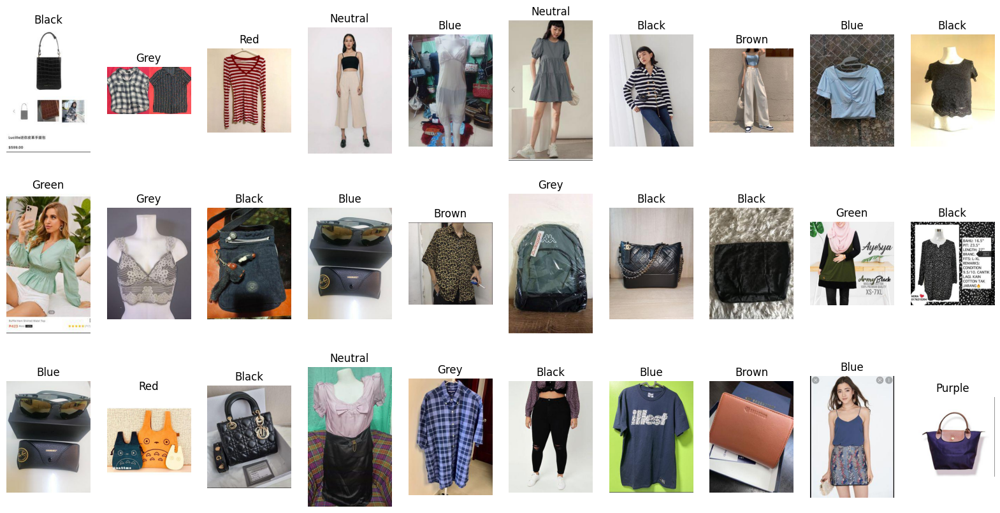

In [103]:
random.seed(31)
fig, ax = plt.subplots(3, 10, figsize=(20, 10))
for i in range(10):
    x = random.randint(0, len(data))
    y = random.randint(0, len(data))
    z = random.randint(0, len(data))
    img1 = data.iloc[x]['image_data']
    img2 = data.iloc[y]['image_data']
    img3 = data.iloc[z]['image_data']
    ax[0, i].imshow(img1)
    ax[0, i].set_title(data.iloc[x]['Base Color'])
    ax[1, i].imshow(img2)
    ax[1, i].set_title(data.iloc[y]['Base Color'])
    ax[2, i].imshow(img3)
    ax[2, i].set_title(data.iloc[z]['Base Color'])
    ax[0, i].axis('off')
    ax[1, i].axis('off')
    ax[2, i].axis('off')
plt.show()

### Image Processing 

#### Removing all unnecessary colors other than the Color HEX given in data

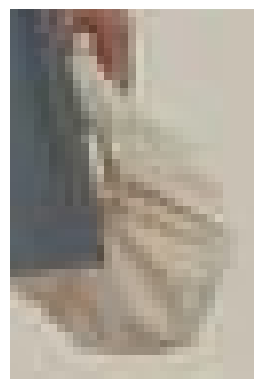

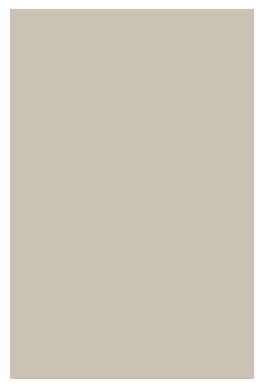

In [104]:
""" def remove_background(img):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(img, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(
        thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = img[y:y+h, x:x+w]
    return crop """

def patch(image):
    image1=image.reshape((image.shape[0]*image.shape[1],3))
    kmeans = KMeans(n_clusters=10, random_state=20, n_init=10).fit(image1)
    labels=kmeans.labels_
    counts=np.bincount(labels)
    colors=kmeans.cluster_centers_
    #plt.pie(counts,colors=colors/255,autopct='%1.1f%%')
    #plt.show()
    sorted_indices = np.argsort(counts)[::-1]
    sorted_colors = colors[sorted_indices]
    majority_color = sorted_colors[0]
    patch = np.zeros(shape=image.shape, dtype=np.uint8)
    patch[:,:,:]=majority_color
    return patch

image,label=data.iloc[571]['image_data_crop'],data.iloc[571]['Base Color']
plt.imshow(image)
plt.axis('off')
plt.show()
patch_color=patch(image)
plt.imshow(patch_color/255)
plt.axis('off')
plt.show()

data['patch']=data['image_data_crop']

In [105]:
""" with concurrent.futures.ThreadPoolExecutor(32) as executor:
    for i, row in data.iterrows():
        image = row['image_data_crop']
        patch_color=patch(image)
        data.at[i, 'patch'] = patch_color """

" with concurrent.futures.ThreadPoolExecutor(32) as executor:\n    for i, row in data.iterrows():\n        image = row['image_data_crop']\n        patch_color=patch(image)\n        data.at[i, 'patch'] = patch_color "

### Plotting the processed images

50
3129
2801
3892
949
571
3033
248
2194
2154


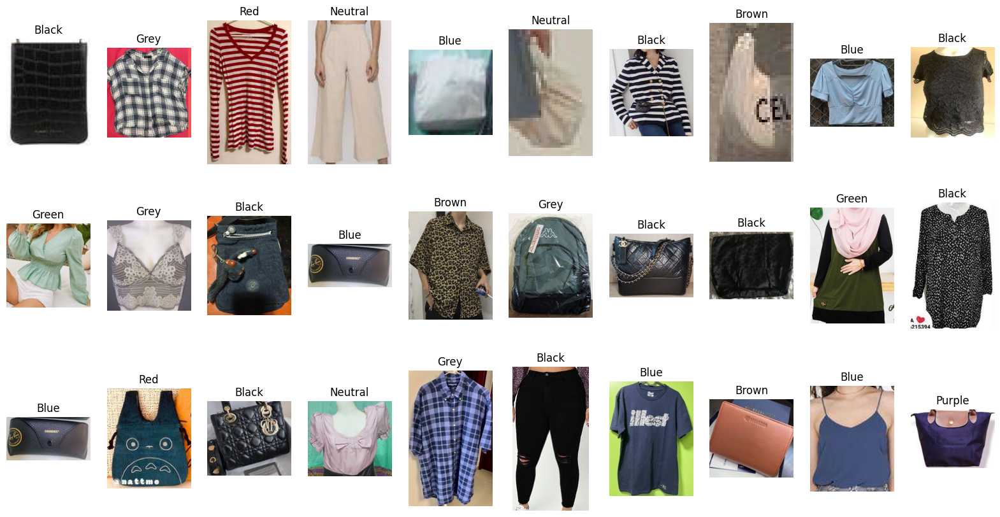

In [106]:
random.seed(31)
fig, ax = plt.subplots(3, 10, figsize=(20, 10))
for i in range(10):
    x = random.randint(0, len(data))
    y = random.randint(0, len(data))
    z = random.randint(0, len(data))
    img1 = data.iloc[x]['image_data_crop']
    img2 = data.iloc[y]['image_data_crop']
    img3 = data.iloc[z]['image_data_crop']
    print(x)
    ax[0, i].imshow(img1)
    ax[0, i].set_title(data.iloc[x]['Base Color'])
    ax[1, i].imshow(img2)
    ax[1, i].set_title(data.iloc[y]['Base Color'])
    ax[2, i].imshow(img3)
    ax[2, i].set_title(data.iloc[z]['Base Color'])
    ax[0, i].axis('off')
    ax[1, i].axis('off')
    ax[2, i].axis('off')
plt.show()

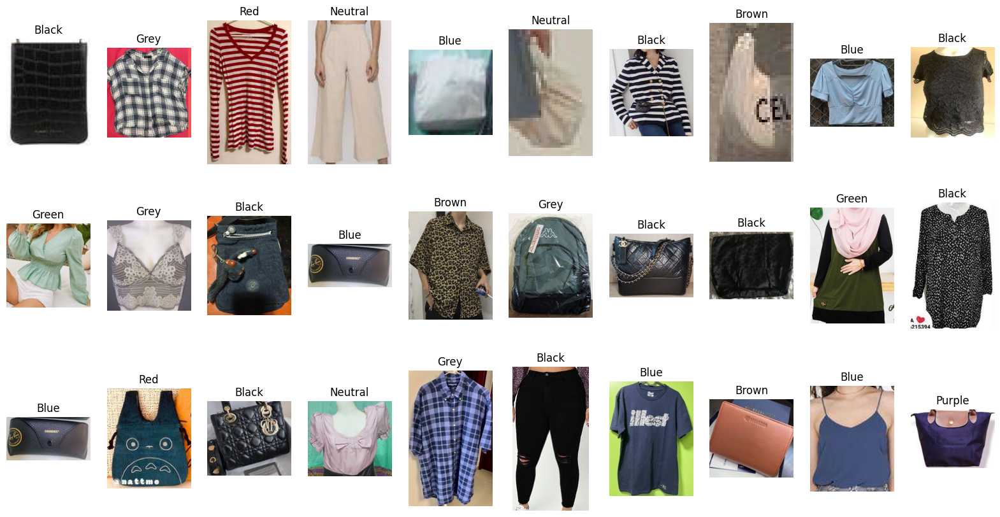

In [107]:
random.seed(31)
fig, ax = plt.subplots(3, 10, figsize=(20, 10))
for i in range(10):
    x = random.randint(0, len(data))
    y = random.randint(0, len(data))
    z = random.randint(0, len(data))
    img1 = data.iloc[x]['patch']
    img2 = data.iloc[y]['patch']
    img3 = data.iloc[z]['patch']
    ax[0, i].imshow(img1)
    ax[0, i].set_title(data.iloc[x]['Base Color'])
    ax[1, i].imshow(img2)
    ax[1, i].set_title(data.iloc[y]['Base Color'])
    ax[2, i].imshow(img3)
    ax[2, i].set_title(data.iloc[z]['Base Color'])
    ax[0, i].axis('off')
    ax[1, i].axis('off')
    ax[2, i].axis('off')
plt.show()

### Splitting the dataset into train,validation and testsets (70%-15%-15%)

In [108]:
from sklearn.model_selection import train_test_split

train_data, temp_data = train_test_split(data, test_size=0.3, random_state=31)
val_data, test_data = train_test_split(
    temp_data, test_size=0.5, random_state=1)

print(train_data.shape)
print(val_data.shape)
print(test_data.shape)

print(train_data['Base Color'].value_counts())

(2844, 8)
(609, 8)
(610, 8)
Base Color
Black      627
Grey       511
Blue       410
Brown      359
Neutral    280
Green      155
Red        142
Pink       121
White      113
Purple      70
Yellow      30
Orange      26
Name: count, dtype: int64


### Upsampling miniority classes to match with the majority class

In [109]:
""" from sklearn.utils import resample

n = max(train_data['Base Color'].value_counts())

desired_sample_sizes = {
    'Black': 627,
    'Grey': 700,
    'White': 1500,
    'Blue': 627,
    'Red': 627,
    'Green': 800,
    'Brown': 700,
    'Yellow': 627,
    'Pink': 827,
    'Purple': 2000,
    'Orange': 700,
    'Neutral': 827,
}

train_data_resampled = pd.DataFrame(columns=train_data.columns)
for color in desired_sample_sizes.keys():
    df = train_data[train_data['Base Color'] == color]
    df_resampled = resample(df, replace=True,
                            n_samples=desired_sample_sizes[color], random_state=1)
    train_data_resampled = pd.concat(
        [train_data_resampled, df_resampled], ignore_index=True)
    
print(train_data_resampled['Base Color'].value_counts()) """

" from sklearn.utils import resample\n\nn = max(train_data['Base Color'].value_counts())\n\ndesired_sample_sizes = {\n    'Black': 627,\n    'Grey': 700,\n    'White': 1500,\n    'Blue': 627,\n    'Red': 627,\n    'Green': 800,\n    'Brown': 700,\n    'Yellow': 627,\n    'Pink': 827,\n    'Purple': 2000,\n    'Orange': 700,\n    'Neutral': 827,\n}\n\ntrain_data_resampled = pd.DataFrame(columns=train_data.columns)\nfor color in desired_sample_sizes.keys():\n    df = train_data[train_data['Base Color'] == color]\n    df_resampled = resample(df, replace=True,\n                            n_samples=desired_sample_sizes[color], random_state=1)\n    train_data_resampled = pd.concat(\n        [train_data_resampled, df_resampled], ignore_index=True)\n    \nprint(train_data_resampled['Base Color'].value_counts()) "

In [110]:
color_dict = {}
for i, c in enumerate(set(data['Base Color'].unique())):
    color_dict[c] = i
print(color_dict)

{'Black': 0, 'White': 1, 'Grey': 2, 'Neutral': 3, 'Pink': 4, 'Orange': 5, 'Blue': 6, 'Purple': 7, 'Red': 8, 'Brown': 9, 'Yellow': 10, 'Green': 11}


### The Color Dataset

In [111]:
from torch.utils.data import Dataset, DataLoader

def normalize_color(image):
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    image[0,:,:] = cv2.equalizeHist(image[0,:,:])
    image = cv2.cvtColor(image, cv2.COLOR_HSV2RGB)
    return image

def remove(img):
    gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    contours = cv2.findContours(thresh,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[0]
    max_contour = max(contours, key=cv2.contourArea)
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    cv2.drawContours(mask, [max_contour], 0, 255, -1)
    result = img.copy()
    result[mask==0] = (255,255,255)
    return result


class ColorDataset(Dataset):
    def __init__(self, data, colors, transform=None):
        self.data = data
        self.transform = transform
        self.color2idx = colors

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img = self.data.iloc[idx]['image_data_crop']
        patch = self.data.iloc[idx]['patch']
        #img = normalize_color(img)
        #img = remove(img)
        img=Image.fromarray(img)
        img = self.transform(img)
        patch=Image.fromarray(patch)
        patch = self.transform(patch)
        label = self.data.iloc[idx]['Base Color']
        label = self.color2idx[label]
        return img, patch, label

### Creating the dataloaders

In [112]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

train_dataset = ColorDataset(train_data,color_dict, transform=transform)
valid_dataset = ColorDataset(val_data,color_dict, transform=transform)
test_dataset = ColorDataset(test_data,color_dict, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=3)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False, num_workers=3)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=3)

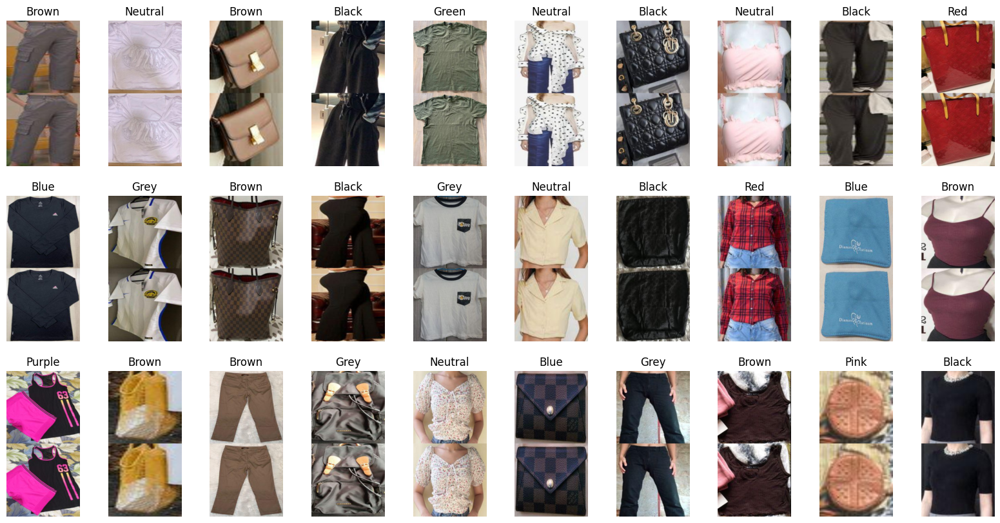

In [113]:
fig, ax = plt.subplots(3, 10, figsize=(20, 10))
for i, (img, patch, label) in enumerate(train_loader):
    if i >= 3:
        break
    for j in range(10):
        grid = torch.cat((img, patch), dim=2)
        ax[i, j].imshow(grid[j].permute(1, 2, 0))
        ax[i, j].set_title(list(color_dict.keys())[list(
            color_dict.values()).index(label[j].item())])
        ax[i, j].axis('off')
plt.show()


### Model Creation , Loss Function and Optimizers

In [114]:
""" import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau


class ColorClassifier(nn.Module):
    def __init__(self):
        super(ColorClassifier, self).__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1), # (256 - 4 + 2 * 1) / 2 + 1 = 128
            nn.MaxPool2d(kernel_size=4, stride=4), # (128 - 4) / 4 + 1 = 32
            nn.BatchNorm2d(64),
            nn.ReLU(),
        )
        
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 256, kernel_size=2, stride=2, padding=1), # (32 - 2 + 2 * 1) / 2 + 1 = 17
            nn.MaxPool2d(kernel_size=3, stride=3), # (17 - 3) / 3 + 1 = 5
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )

        self.conv3 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=2, stride=1, padding=1), # (5 - 2 + 2 * 1) / 1 + 1 = 6
            nn.MaxPool2d(kernel_size=3, stride=1), # (6 - 3) / 1 + 1 = 4
            nn.BatchNorm2d(128),
            nn.ReLU(),
        )
        
        self.conv4 = nn.Sequential(
            nn.Conv2d(128, 512, kernel_size=2, stride=1, padding=1), # (4 - 2 + 2 * 1) / 1 + 1 = 5
            nn.MaxPool2d(kernel_size=2, stride=1), # (5 - 2) / 1 + 1 = 4
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Dropout(0.2),
        )
        
        self.fc1 = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512 * 4 * 4, 512),
            nn.ReLU(),
        )
        
        self.fc2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        self.fc3 = nn.Sequential(
            nn.Linear(256, 12),
        )

        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        return x


model1 = ColorClassifier()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = ReduceLROnPlateau(optimizer, mode='min', patience=3, verbose=True) """

" import torch.nn as nn\nimport torch.optim as optim\nfrom torch.optim.lr_scheduler import ReduceLROnPlateau\n\n\nclass ColorClassifier(nn.Module):\n    def __init__(self):\n        super(ColorClassifier, self).__init__()\n        \n        self.conv1 = nn.Sequential(\n            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1), # (256 - 4 + 2 * 1) / 2 + 1 = 128\n            nn.MaxPool2d(kernel_size=4, stride=4), # (128 - 4) / 4 + 1 = 32\n            nn.BatchNorm2d(64),\n            nn.ReLU(),\n        )\n        \n        self.conv2 = nn.Sequential(\n            nn.Conv2d(64, 256, kernel_size=2, stride=2, padding=1), # (32 - 2 + 2 * 1) / 2 + 1 = 17\n            nn.MaxPool2d(kernel_size=3, stride=3), # (17 - 3) / 3 + 1 = 5\n            nn.BatchNorm2d(256),\n            nn.ReLU(),\n        )\n\n        self.conv3 = nn.Sequential(\n            nn.Conv2d(256, 128, kernel_size=2, stride=1, padding=1), # (5 - 2 + 2 * 1) / 1 + 1 = 6\n            nn.MaxPool2d(kernel_size=3, stride=1), # 

In [115]:
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1, num_skip_connections=4):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.skip_connections = nn.ModuleList([nn.Sequential() for _ in range(num_skip_connections)])
        for i in range(num_skip_connections):
            if stride != 1 or in_channels != out_channels:
                self.skip_connections[i] = nn.Sequential(
                    nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                    nn.BatchNorm2d(out_channels)
                )
        
    def forward(self, x):
        residual = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)

        for skip_connection in self.skip_connections:
            out += skip_connection(residual)

        out = self.relu(out)
        return out

class ResNet(nn.Module):
    def __init__(self, block, layers, num_classes=12):
        super(ResNet, self).__init__()
        self.in_channels = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        
        self.layer1 = self.make_layer(block, 64, layers[0])
        self.layer2 = self.make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self.make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self.make_layer(block, 512, layers[3], stride=2)
        
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512, num_classes)
        
    def make_layer(self, block, out_channels, blocks, stride=1):
        layers = []
        layers.append(block(self.in_channels, out_channels, stride))
        self.in_channels = out_channels
        for _ in range(1, blocks):
            layers.append(block(out_channels, out_channels))
        return nn.Sequential(*layers)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        
        return x

model = ResNet(ResidualBlock, [2,2,2,2], num_classes=12)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = ReduceLROnPlateau(optimizer, mode='min', patience=3, verbose=True)


In [116]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
criterion.to(device)

CrossEntropyLoss()

In [117]:
from torchsummary import summary
summary(model, (3, 256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]          36,864
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
    ResidualBlock-11           [-1, 64, 64, 64]               0
           Conv2d-12           [-1, 64, 64, 64]          36,864
      BatchNorm2d-13           [-1, 64, 64, 64]             128
             ReLU-14           [-1, 64,

### Prediction for a single image by Untrained model

In [118]:
images ,patch, labels = next(iter(test_loader))
images ,patch, labels = images.to(device),patch.to(device), labels.to(device)
output = model(images)
print(output[0])
_, preds = torch.max(output, 1)
print("Actual:", labels[0])
print("Predicted:", preds[0])

tensor([ 1.0850, -1.6342, -3.2592,  0.1555,  0.0998, -3.2018, -3.1835, -3.1282,
        -3.5843,  1.0081, -1.5483, -0.4256], device='cuda:0',
       grad_fn=<SelectBackward0>)
Actual: tensor(3, device='cuda:0')
Predicted: tensor(0, device='cuda:0')


In [119]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

### Training Loop

In [120]:
import mlflow
epochs = 32
valid_loss_min = np.Inf
train_losses = []
valid_losses = []
train_accs = []
valid_accs = []
mlflow.set_experiment("Color_Classifier_crops")
with mlflow.start_run() as run:
    mlflow.log_param("epochs", epochs)
    mlflow.log_param("Learning Rate", 0.001)
    mlflow.log_param("scheduler", "ReduceLROnPlateau")
    mlflow.log_param("Optimizer", "Adam")
    mlflow.log_param("Loss Function", "CrossEntropyLoss")
    mlflow.log_param("Batch Size", 64)
    mlflow.log_param("Activation", "ReLU")
    for epoch in range(epochs):
        train_loss = 0
        valid_loss = 0
        train_acc = 0
        valid_acc = 0
        model.train()
        for images, patch, labels in train_loader:
            images, patch, labels = images.to(device),patch.to(device), labels.to(device)
            optimizer.zero_grad()
            output = model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()*images.size(0)
            _, preds = torch.max(output, 1)
            train_acc += torch.sum(preds == labels.data)
        model.eval()
        for images, patch, labels in valid_loader:
            images, patch, labels = images.to(device),patch.to(device), labels.to(device)
            output = model(images)
            loss = criterion(output, labels)
            valid_loss += loss.item()*images.size(0)
            _, preds = torch.max(output, 1)
            valid_acc += torch.sum(preds == labels.data)
        train_loss = train_loss/len(train_loader.dataset)
        valid_loss = valid_loss/len(valid_loader.dataset)
        train_acc = train_acc/len(train_loader.dataset)*100
        valid_acc = valid_acc/len(valid_loader.dataset)*100
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)
        train_accs.append(train_acc.item())
        valid_accs.append(valid_acc.item())
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Accuracy: {:.6f}'.format(
            epoch+1, train_loss, valid_loss, train_acc, valid_acc))
        mlflow.log_metric("train_loss", train_loss)
        mlflow.log_metric("valid_loss", valid_loss)
        mlflow.log_metric("train_acc", train_acc)
        mlflow.log_metric("valid_acc", valid_acc)
        writer.add_scalar('Loss/train', train_loss, epoch)
        writer.add_scalar('Loss/valid', valid_loss, epoch)
        writer.add_scalar('Accuracy/train', train_acc, epoch)
        writer.add_scalar('Accuracy/valid', valid_acc, epoch)
        if valid_loss < valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}). Saving model...'.format(
                valid_loss_min, valid_loss))
            torch.save(model.state_dict(), 'model1.pt')
            valid_loss_min = valid_loss
        scheduler.step(valid_loss)
    mlflow.pytorch.log_model(model, "model1")
    writer.add_graph(model, images)
    current_run_id = mlflow.active_run().info.run_id

Epoch: 1 	Training Loss: 2.183933 	Validation Loss: 1.307954 	Training Accuracy: 50.246132 	Validation Accuracy: 61.412151
Validation loss decreased (inf --> 1.307954). Saving model...
Epoch: 2 	Training Loss: 1.307407 	Validation Loss: 1.344928 	Training Accuracy: 60.724331 	Validation Accuracy: 61.412151
Epoch: 3 	Training Loss: 1.128797 	Validation Loss: 1.481898 	Training Accuracy: 63.607590 	Validation Accuracy: 62.725784
Epoch: 4 	Training Loss: 1.093669 	Validation Loss: 1.143041 	Training Accuracy: 66.279892 	Validation Accuracy: 69.129723
Validation loss decreased (1.307954 --> 1.143041). Saving model...
Epoch: 5 	Training Loss: 0.972861 	Validation Loss: 1.202556 	Training Accuracy: 68.108299 	Validation Accuracy: 65.353035
Epoch: 6 	Training Loss: 0.893409 	Validation Loss: 1.456650 	Training Accuracy: 69.725731 	Validation Accuracy: 56.321842
Epoch: 7 	Training Loss: 0.927005 	Validation Loss: 1.411453 	Training Accuracy: 69.022499 	Validation Accuracy: 57.799675
Epoch: 8 	

2023/10/27 12:31:56 WARNING mlflow.utils.requirements_utils: Found torch version (2.0.1+cu118) contains a local version label (+cu118). MLflow logged a pip requirement for this package as 'torch==2.0.1' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.


Epoch: 32 	Training Loss: 0.586036 	Validation Loss: 0.844370 	Training Accuracy: 78.481010 	Validation Accuracy: 73.070610


2023/10/27 12:32:00 WARNING mlflow.utils.requirements_utils: Found torch version (2.0.1+cu118) contains a local version label (+cu118). MLflow logged a pip requirement for this package as 'torch==2.0.1' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.


### Test Accuracy

In [121]:
with mlflow.start_run(run_id=current_run_id):
    model.eval()
    wrong=0
    test_acc = 0
    for images,patch, labels in test_loader:
        images, patch, labels = images.to(device),patch.to(device), labels.to(device)
        output = model(images)
        _, preds = torch.max(output, 1)
        test_acc += torch.sum(preds == labels.data)
        wrong += torch.sum(preds != labels.data)
    test_acc = test_acc/len(test_loader.dataset)*100
    mlflow.log_metric("test_acc", test_acc)
    print("Test Accuracy: {:.6f}".format(test_acc))
    print("Wrong Predictions: ", wrong.item())
    print("Total Predictions: ", len(test_loader.dataset))

Test Accuracy: 75.573769
Wrong Predictions:  149
Total Predictions:  610


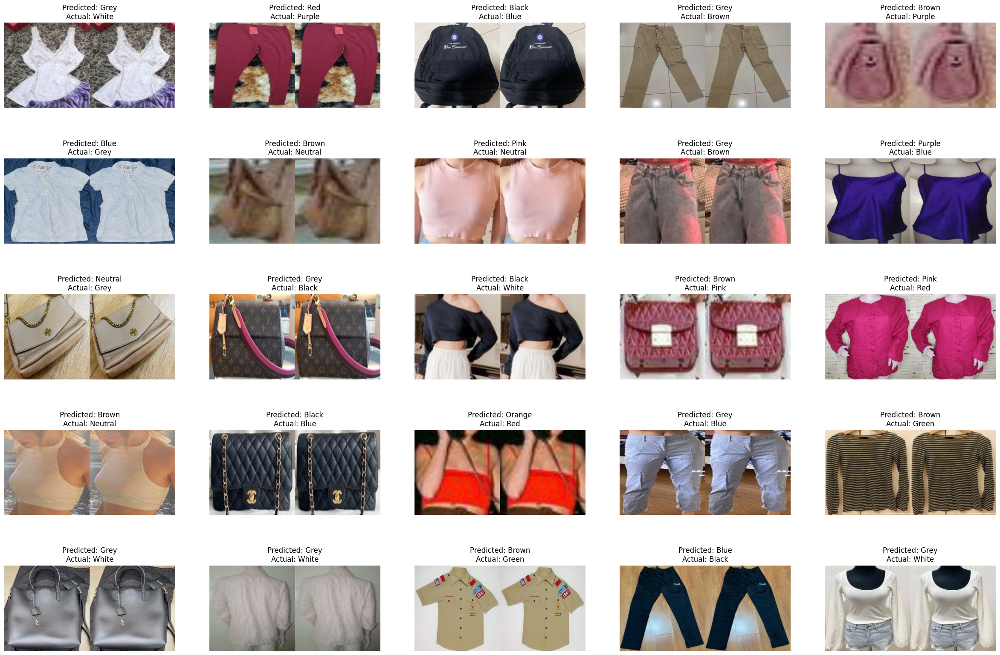

In [122]:
model.eval()
fig, ax = plt.subplots(5, 5, figsize=(30, 20))
count = 0
for images, patch, labels in test_loader:
    images, patch, labels = images.to(device), patch.to(device), labels.to(device)
    output = model(images)
    _, preds = torch.max(output, 1)
    for j in range(len(labels)):
        if preds[j] != labels[j]:
            grid = torch.cat((images[j], patch[j]), dim=2)

            ax[count//5, count % 5].imshow(grid.cpu().permute(1, 2, 0))
            ax[count//5, count % 5].set_title("Predicted: {}\nActual: {}".format(
                list(color_dict.keys())[list(color_dict.values()).index(preds[j].item())], list(color_dict.keys())[list(color_dict.values()).index(labels[j].item())]))
            ax[count//5, count % 5].axis('off')
            count += 1
            if count == 25:
                break
    if count == 25:
        break
plt.show()


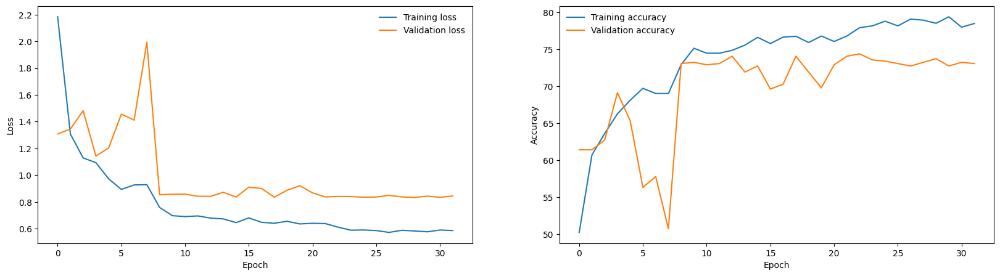

In [123]:
fig = plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(frameon=False)
plt.subplot(1, 2, 2)
plt.plot(train_accs, label='Training accuracy')
plt.plot(valid_accs, label='Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(frameon=False)
plt.show()

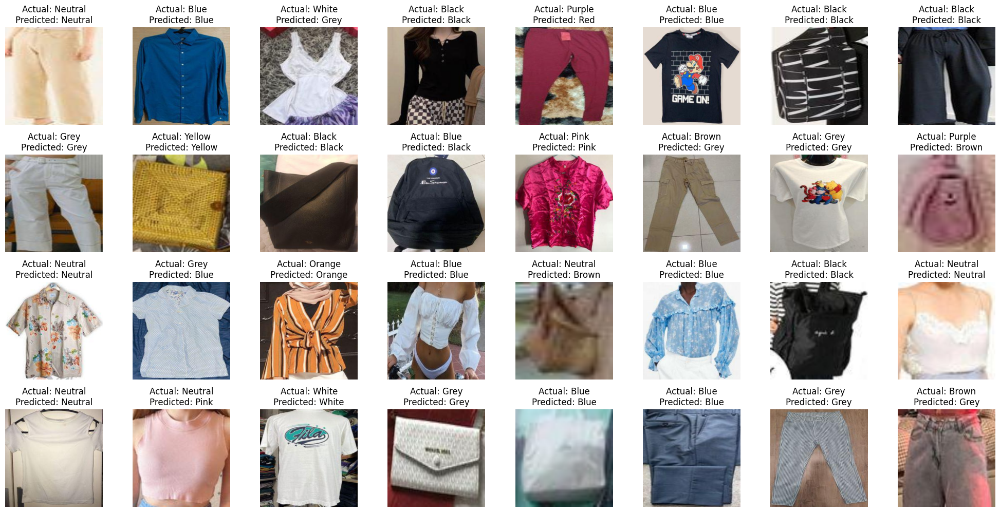

In [124]:
images, patch, labels = next(iter(test_loader))
images,patch, labels = images.to(device),patch.to(device), labels.to(device)
output = model(images)
_, preds = torch.max(output, 1)
fig = plt.figure(figsize=(20, 20))
for i in range(32):
    ax = plt.subplot(8, 8, i+1)
    ax.imshow(images[i].permute(1, 2, 0).cpu())
    ax.set_title("Actual: {}\nPredicted: {}".format(
        list(color_dict.keys())[
            list(color_dict.values()).index(labels[i].item())],
        list(color_dict.keys())[
            list(color_dict.values()).index(preds[i].item())]
    ))
    ax.axis('off')
plt.tight_layout()
plt.show()

In [125]:
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

model.to(device)
model.eval()
y_pred = []
y_true = []
for images,patch, labels in test_loader:
    images,patch, labels = images.to(device),patch.to(device), labels.to(device)
    output = model(images)
    _, preds = torch.max(output, 1)
    y_pred.extend(preds.tolist())
    y_true.extend(labels.tolist())
print("F1 Score: {:.6f}".format(f1_score(y_true, y_pred, average='weighted')))
print("Precision: {:.6f}".format(
    precision_score(y_true, y_pred, average='weighted')))
print("Recall: {:.6f}".format(recall_score(
    y_true, y_pred, average='weighted')))
print("Confusion Matrix:")
print(confusion_matrix(y_true, y_pred))

F1 Score: 0.753127
Precision: 0.754195
Recall: 0.755738
Confusion Matrix:
[[127   0   8   1   0   0   3   0   0   2   0   1]
 [  1  12   8   3   0   0   0   0   0   1   0   1]
 [  9   2  79   6   0   0   8   0   0   5   0   2]
 [  1   4   3  33   3   0   0   0   0   8   0   1]
 [  0   0   1   2  14   1   0   0   1   2   0   0]
 [  0   0   0   2   0   6   0   0   1   0   0   0]
 [ 12   1   2   0   0   0  73   2   0   0   0   0]
 [  0   0   0   0   1   0   2   9   2   3   0   0]
 [  0   0   0   0   3   1   0   0  19   3   0   0]
 [  3   0  10   2   0   0   0   2   1  56   0   0]
 [  0   0   0   0   0   0   0   0   0   0   2   0]
 [  3   0   2   0   0   0   1   0   0   2   0  31]]


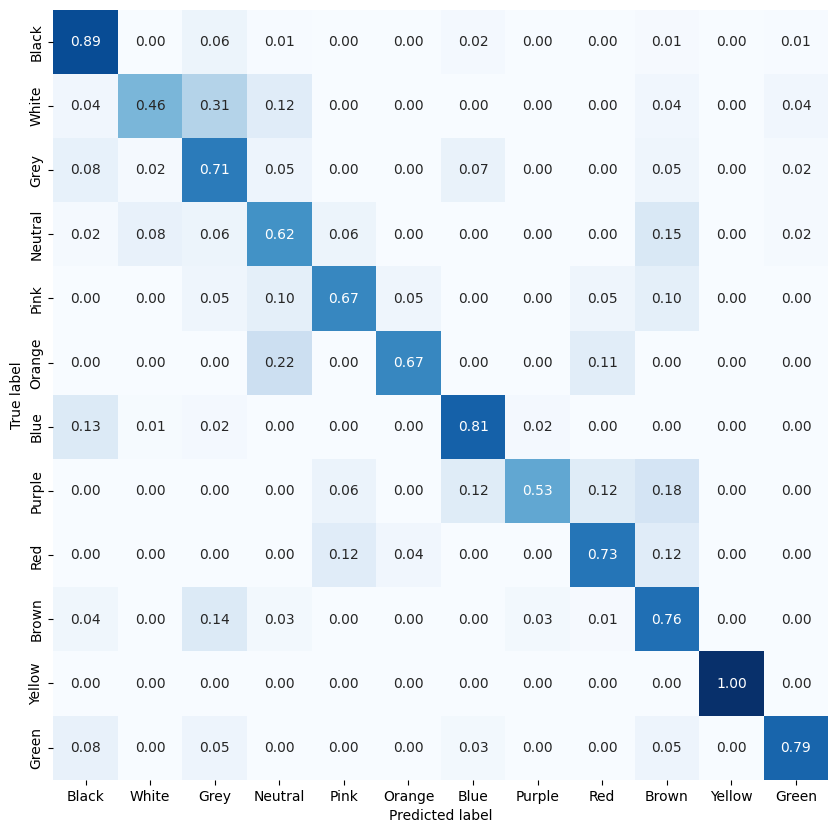

In [126]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
df_cm = pd.DataFrame(cm, index=list(color_dict.keys()),
                     columns=list(color_dict.keys()))
plt.figure(figsize=(10, 10))
sns.heatmap(df_cm, annot=True, cmap='Blues', fmt='.2f', cbar=False)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [127]:
writer.close()

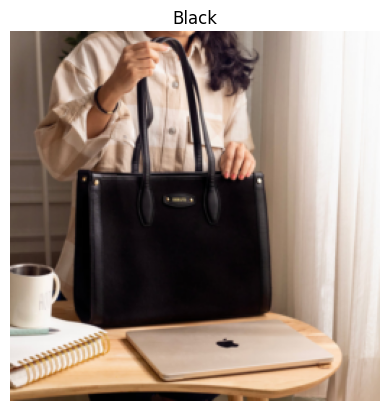

In [128]:
model.to(device)
model.eval()
url='https://www.themessycorner.in/cdn/shop/products/07_800x.jpg?v=1680598271'
r=requests.get(url)
image1=Image.open(BytesIO(r.content))
image=transform(image1)
image=image.unsqueeze(0)
image=image.to(device)
output=model(image)
_,preds=torch.max(output,1)
plt.imshow(image.cpu().squeeze().permute(1,2,0))
plt.title(list(color_dict.keys())[list(color_dict.values()).index(preds.item())])
plt.axis('off')
plt.show()

In [129]:
""" def get_dominant_color(pil_img, palette_size=16):
    img = pil_img.copy()
    img.thumbnail((100, 100))
    paletted = img.convert('P', palette=Image.ADAPTIVE, colors=palette_size)
    palette = paletted.getpalette()
    color_counts = sorted(paletted.getcolors(), reverse=True)
    palette_index = color_counts[0][1]
    dominant_color = palette[palette_index*3:palette_index*3+3]
    return dominant_color

color_rgb_values = {
    'Black': (0, 0, 0),
    'Grey': (128, 128, 128),
    'White': (255, 255, 255),
    'Blue': (0, 0, 255),
    'Red': (255, 0, 0),
    'Green': (0, 255, 0),
    'Brown': (165, 42, 42),
    'Yellow': (255, 255, 0),
    'Pink': (181, 125, 138),
    'Purple': (128, 0, 128),
    'Orange': (255, 165, 0),
    'Neutral': 	(213, 173, 161)
}

from scipy.spatial import KDTree
color_names = list(color_rgb_values.keys())
rgb_values = np.array(list(color_rgb_values.values()))
kdtree = KDTree(rgb_values)

def get_color_name(image):
    color = get_dominant_color(image)
    _, index = kdtree.query(color)
    return color_names[index]

transform=transforms.Compose([
    transforms.Resize((256, 256)),
])
test_dataset=ColorDataset(test_data,color_dict, transform=transform)

fig, ax = plt.subplots(2, 5, figsize=(20, 10))
count = 0
for images, labels in test_dataset:
    ax[count//5, count % 5].imshow(images)
    ax[count//5, count % 5].set_title("Predicted: {}\nActual: {}".format(
        get_color_name(images), list(color_dict.keys())[list(color_dict.values()).index(labels)]))
    ax[count//5, count % 5].axis('off')
    count += 1
    if count == 10:
        break

plt.show()


acc=0
correct=0
for images,labels in test_dataset:
    if get_color_name(images)==list(color_dict.keys())[list(color_dict.values()).index(labels)]:
        correct+=1
print(correct/len(test_dataset)*100) """

' def get_dominant_color(pil_img, palette_size=16):\n    img = pil_img.copy()\n    img.thumbnail((100, 100))\n    paletted = img.convert(\'P\', palette=Image.ADAPTIVE, colors=palette_size)\n    palette = paletted.getpalette()\n    color_counts = sorted(paletted.getcolors(), reverse=True)\n    palette_index = color_counts[0][1]\n    dominant_color = palette[palette_index*3:palette_index*3+3]\n    return dominant_color\n\ncolor_rgb_values = {\n    \'Black\': (0, 0, 0),\n    \'Grey\': (128, 128, 128),\n    \'White\': (255, 255, 255),\n    \'Blue\': (0, 0, 255),\n    \'Red\': (255, 0, 0),\n    \'Green\': (0, 255, 0),\n    \'Brown\': (165, 42, 42),\n    \'Yellow\': (255, 255, 0),\n    \'Pink\': (181, 125, 138),\n    \'Purple\': (128, 0, 128),\n    \'Orange\': (255, 165, 0),\n    \'Neutral\': \t(213, 173, 161)\n}\n\nfrom scipy.spatial import KDTree\ncolor_names = list(color_rgb_values.keys())\nrgb_values = np.array(list(color_rgb_values.values()))\nkdtree = KDTree(rgb_values)\n\ndef get_colo